<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc" style="margin-top: 1em;"><ul class="toc-item"><li><span><a href="#Load-the-pretrained-VGG-model" data-toc-modified-id="Load-the-pretrained-VGG-model-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Load the pretrained VGG model</a></span></li><li><span><a href="#Load-Coco-Animals-Dataset" data-toc-modified-id="Load-Coco-Animals-Dataset-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Load Coco Animals Dataset</a></span></li><li><span><a href="#Load-ImageNet-dataset-for-labels" data-toc-modified-id="Load-ImageNet-dataset-for-labels-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Load ImageNet dataset for labels</a></span></li><li><span><a href="#imports-and-common-variables-for-VGG16" data-toc-modified-id="imports-and-common-variables-for-VGG16-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>imports and common variables for VGG16</a></span></li><li><span><a href="#Predict-coco-animals-images-using-VGG16" data-toc-modified-id="Predict-coco-animals-images-using-VGG16-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Predict coco animals images using VGG16</a></span></li><li><span><a href="#Predict-coco-animals-images-using-VGG16---Preprocessing-in-TF" data-toc-modified-id="Predict-coco-animals-images-using-VGG16---Preprocessing-in-TF-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Predict coco animals images using VGG16 - Preprocessing in TF</a></span></li><li><span><a href="#Predict-coco-animals-images-using-retrained-VGG16" data-toc-modified-id="Predict-coco-animals-images-using-retrained-VGG16-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Predict coco animals images using retrained VGG16</a></span></li></ul></div>

# VGG16 in TensorFlow <a class="tocSkip">

In [1]:
import os

import numpy as np
np.random.seed(123)
print("NumPy:{}".format(np.__version__))

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.pylab import rcParams
rcParams['figure.figsize']=15,10
print("Matplotlib:{}".format(mpl.__version__))

import tensorflow as tf
tf.set_random_seed(123)
print("TensorFlow:{}".format(tf.__version__))
from tensorflow.contrib import slim

NumPy:1.13.1
Matplotlib:2.1.0
TensorFlow:1.4.1


In [2]:
DATASETSLIB_HOME = os.path.expanduser('~/dl-ts/datasetslib')
import sys
if not DATASETSLIB_HOME in sys.path:
    sys.path.append(DATASETSLIB_HOME)
%reload_ext autoreload
%autoreload 2
import datasetslib

from datasetslib import util as dsu
from datasetslib import nputil
datasetslib.datasets_root = os.path.join(os.path.expanduser('~'),'datasets')
models_root = os.path.join(os.path.expanduser('~'),'models')

# VGG16 Model in TensorFlow

### Load the pretrained VGG model

In [3]:
# download the checkpoint file

model_name='vgg_16'
model_url='http://download.tensorflow.org/models/'
model_files=['vgg_16_2016_08_28.tar.gz']
model_home=os.path.join(models_root,model_name)        
        
dsu.download_dataset(source_url=model_url,
                        source_files=model_files,
                        dest_dir = model_home,
                        force=False,
                        extract=True)

Already exists: /home/armando/models/vgg_16/vgg_16_2016_08_28.tar.gz


['vgg_16_2016_08_28.tar.gz']

In [4]:
# helper function

def disp(images,id2label=None,probs=None,n_top=5,scale=False):
    if scale:
        imgs = np.abs(images + np.array([[[[123.68, 116.78, 103.94]]]]))/255.0
    else:
        imgs = images

    ids={}
    for j in range(len(images)):
        if scale:
            plt.figure(figsize=(5,5))
            plt.imshow(imgs[j])
        else:
            plt.imshow(imgs[j].astype(np.uint8) )
        plt.show()
        if probs is not None:
            ids[j] = [i[0] for i in sorted(enumerate(-probs[j]), key=lambda x:x[1])]
            for k in range(n_top):
                id = ids[j][k]
                print('Probability {0:1.2f}% of [{1:}]'
                      .format(100*probs[j,id],id2label[id]))

### Load Coco Animals Dataset

In [5]:
# Load the dataset
from datasetslib.coco import coco_animals

coco = coco_animals()
x_train_files, y_train, x_val_files, x_val = coco.load_data()
#x_test = [x_train_files[0],x_train_files[245]]
x_test = [x_val_files[25*x] for x in range(8)]

Already exists: /home/armando/datasets/coco-animals/coco-animals.zip


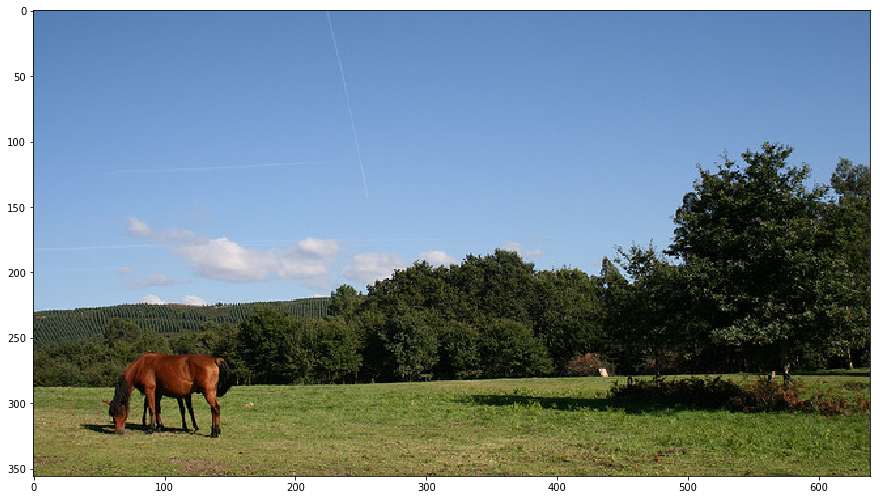

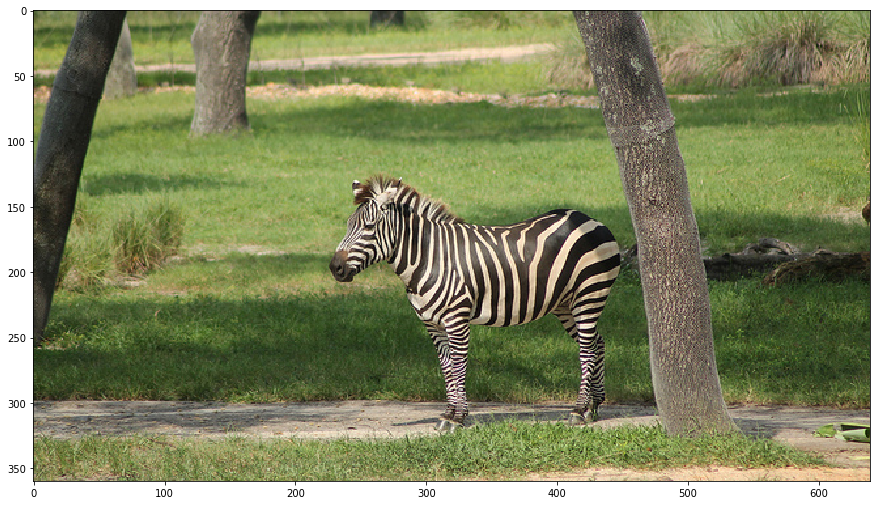

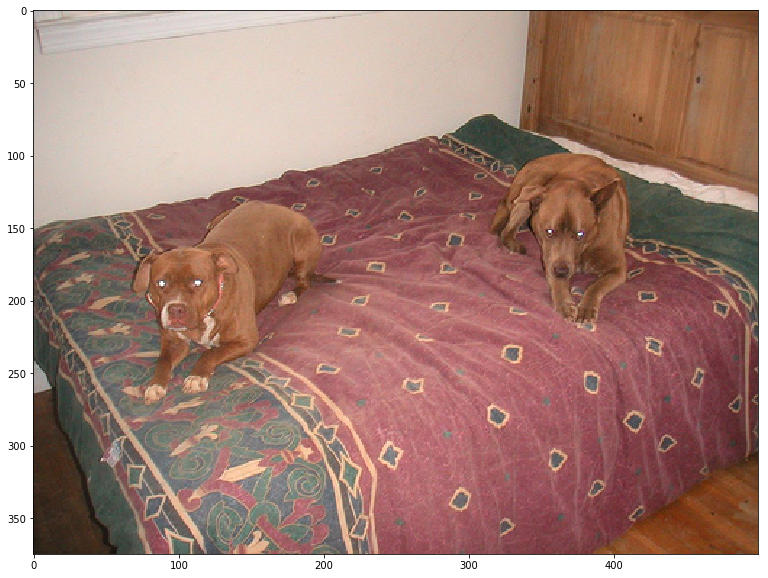

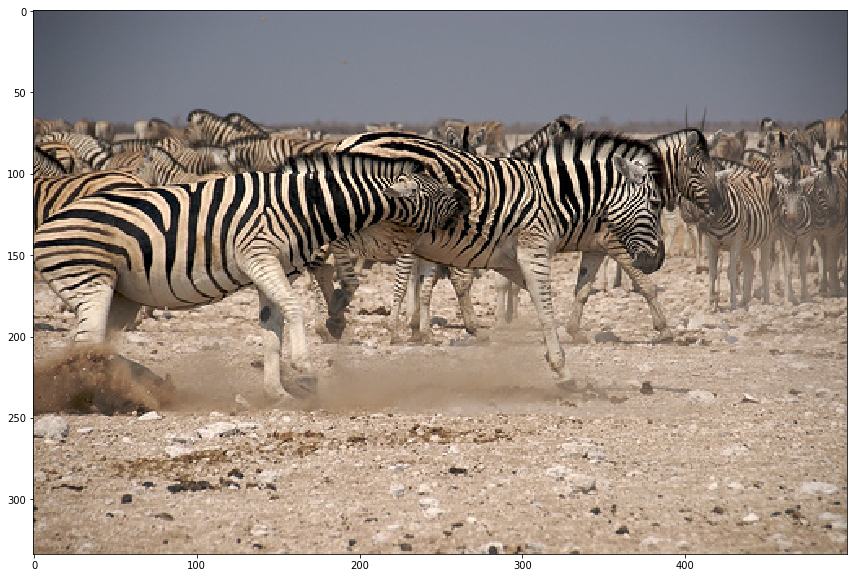

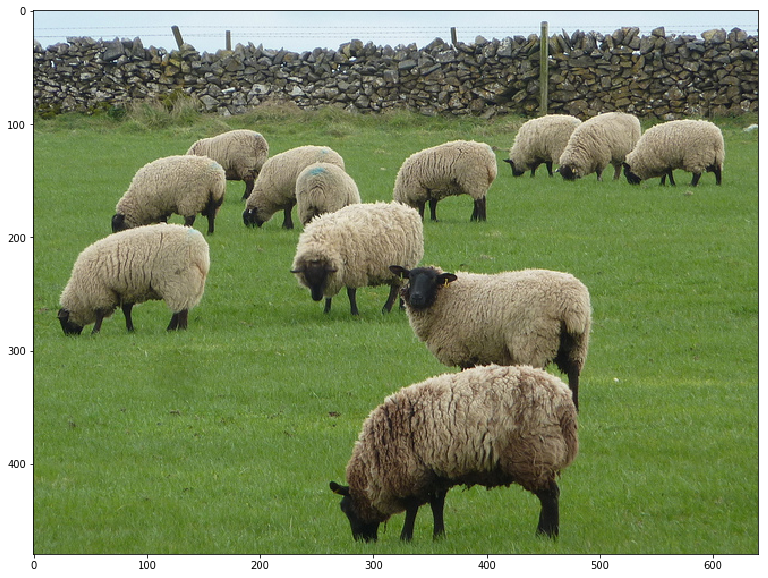

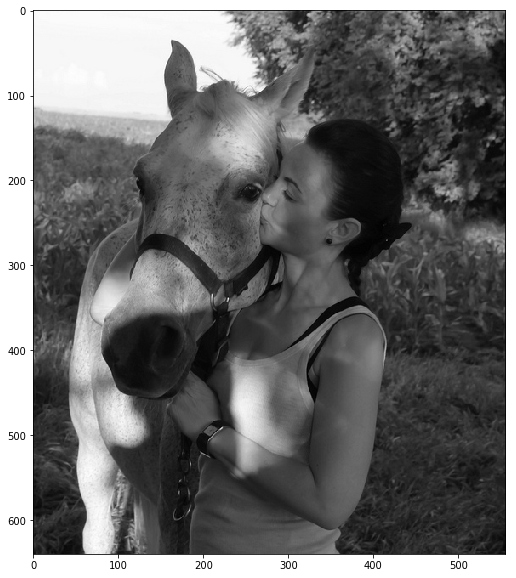

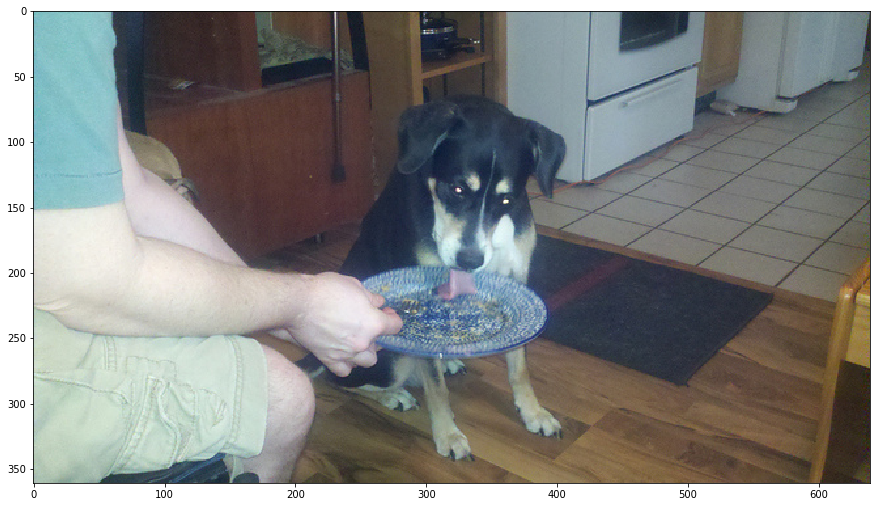

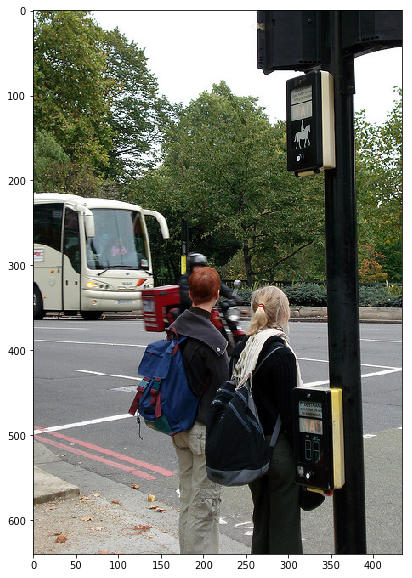

In [6]:
images=np.array([mpimg.imread(x) for x in x_test])
disp(images)

In [7]:
print([x.shape for x in images])

[(356, 640, 3), (360, 640, 3), (375, 500, 3), (334, 500, 3), (480, 640, 3), (640, 556, 3), (361, 640, 3), (640, 434, 3)]


In [8]:
images_test=np.array([coco.preprocess_for_vgg(x) for x in x_test])
print(images_test.shape)

(8, 224, 224, 3)


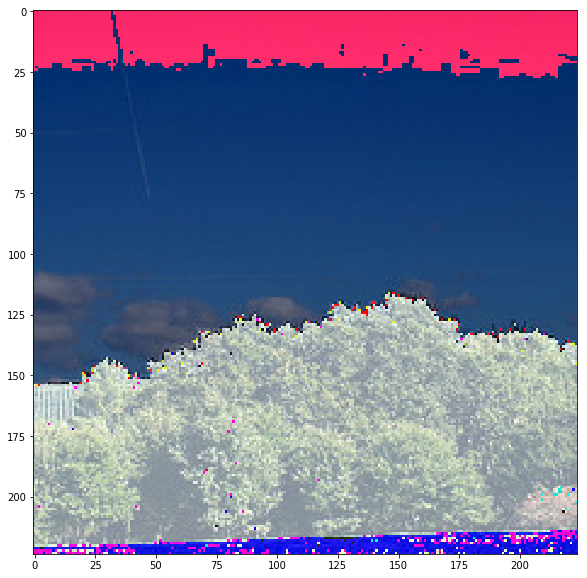

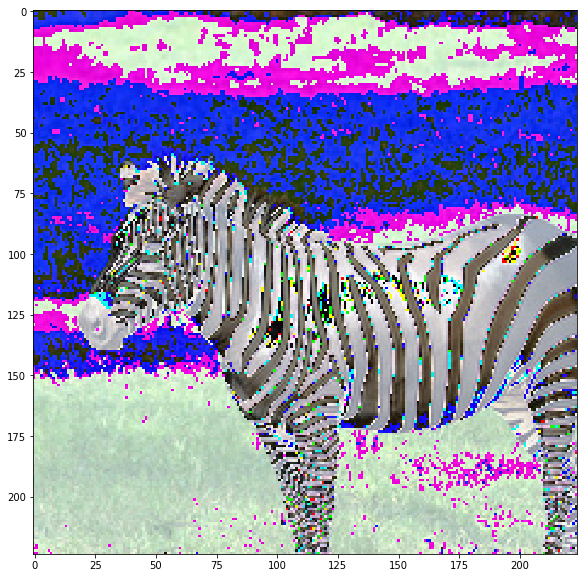

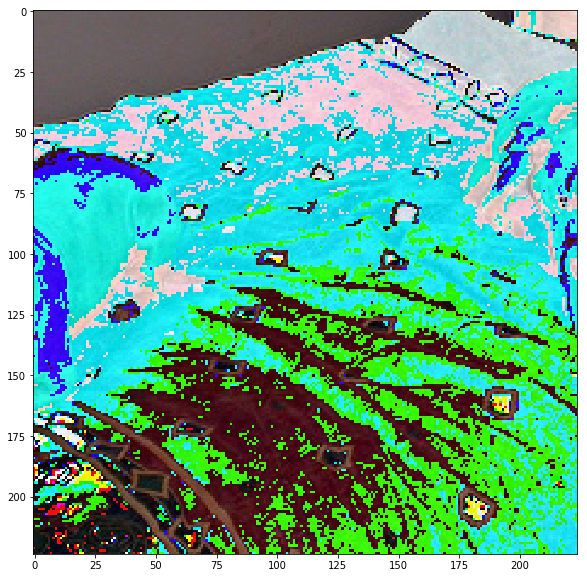

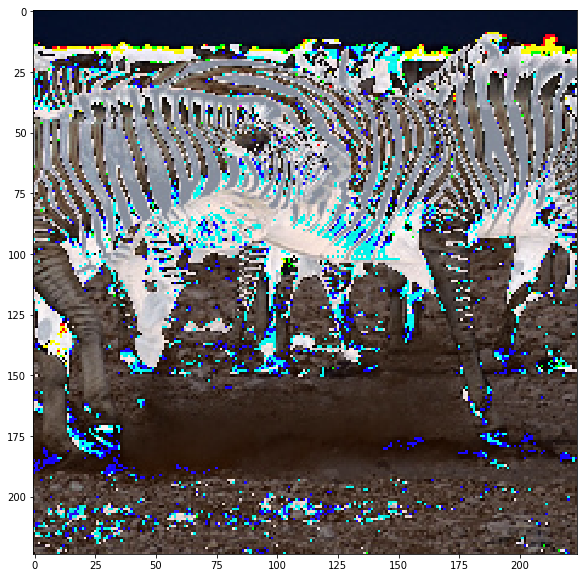

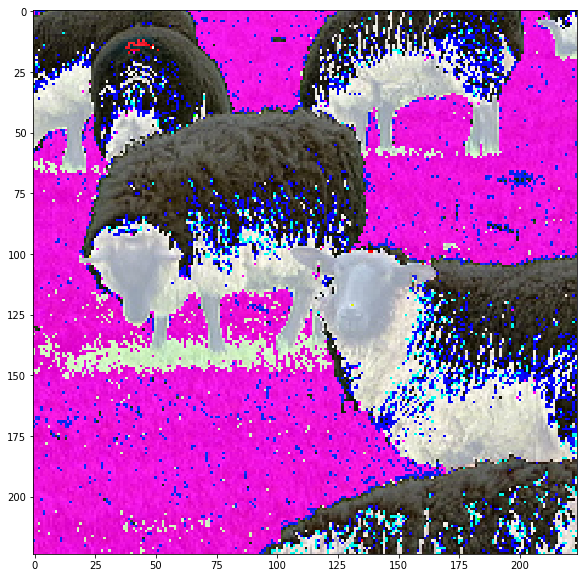

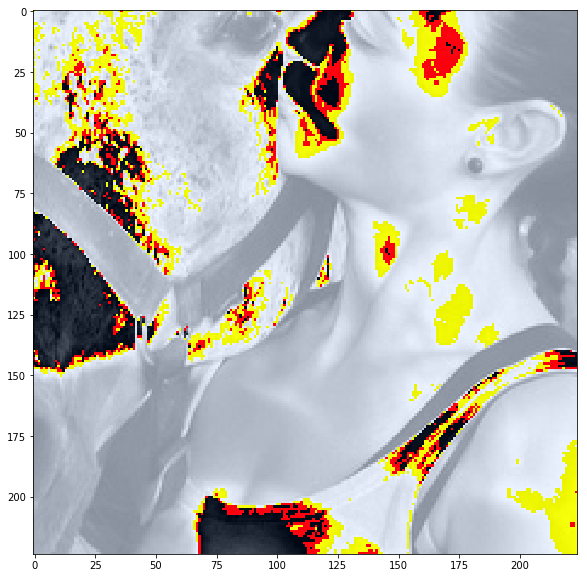

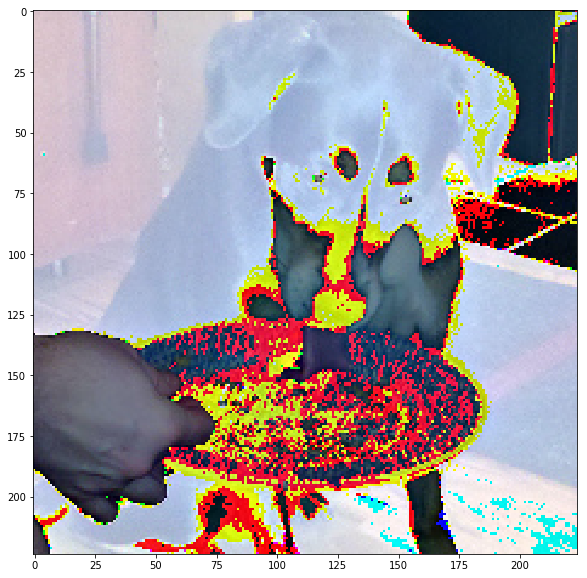

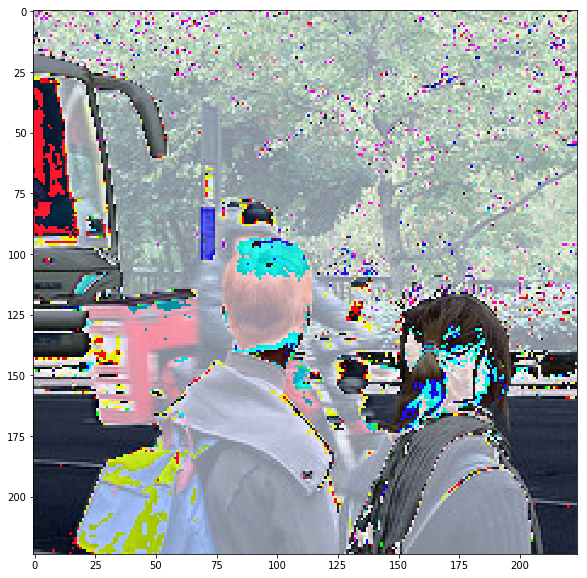

In [9]:
disp(images_test)

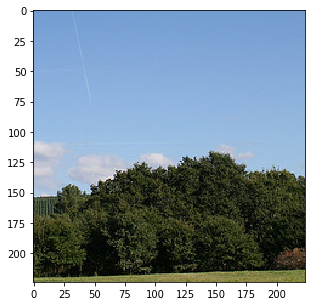

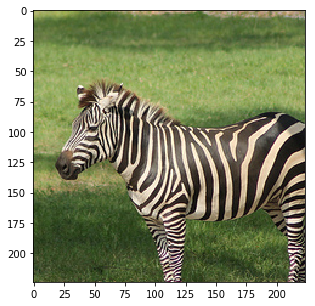

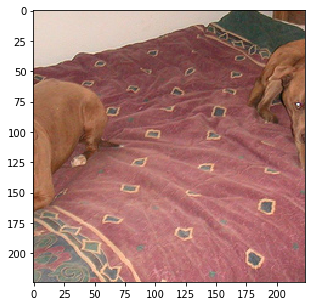

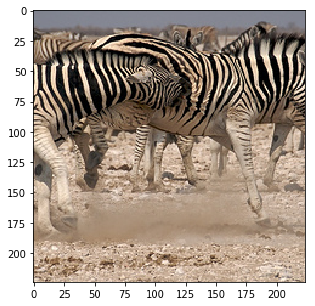

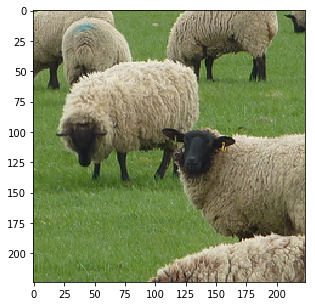

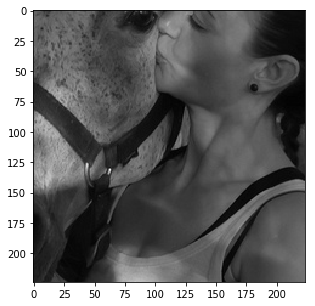

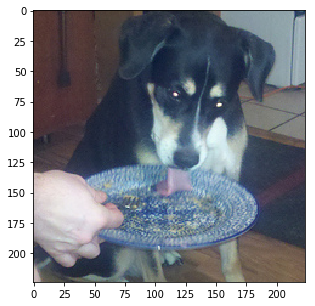

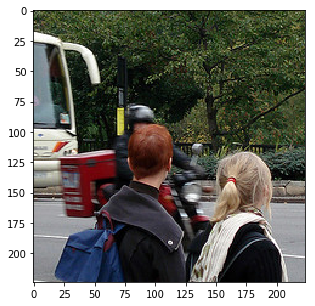

In [10]:
disp(images_test,scale=True)

### Load ImageNet dataset for labels

In [11]:
### Load ImageNet dataset for labels
from datasetslib.imagenet import imageNet
inet = imageNet()
inet.load_data(n_classes=1000)

### imports and common variables for VGG16

In [12]:
### imports and common variables for VGG16
from tensorflow.contrib import slim
from tensorflow.contrib.slim.nets import vgg
image_height=vgg.vgg_16.default_image_size
image_width=vgg.vgg_16.default_image_size

### Predict coco animals images using VGG16

In [13]:
tf.reset_default_graph()

In [14]:
x_p = tf.placeholder(shape=(None,
                            image_height, 
                            image_width,
                            3
                           ),
                     dtype=tf.float32,
                     name='x_p'
                    )
print(x_p)

Tensor("x_p:0", shape=(?, 224, 224, 3), dtype=float32)


In [15]:
with slim.arg_scope(vgg.vgg_arg_scope()):
    logits,_ = vgg.vgg_16(x_p,
                          num_classes=inet.n_classes,
                          is_training=False
                         )
probabilities = tf.nn.softmax(logits)

init = slim.assign_from_checkpoint_fn(
        os.path.join(model_home, '{}.ckpt'.format(model_name)),
        slim.get_variables_to_restore())

In [16]:
with tf.Session() as tfs:
    init(tfs)
    probs = tfs.run([probabilities],feed_dict={x_p:images_test})
    probs=probs[0]

INFO:tensorflow:Restoring parameters from /home/armando/models/vgg_16/vgg_16.ckpt


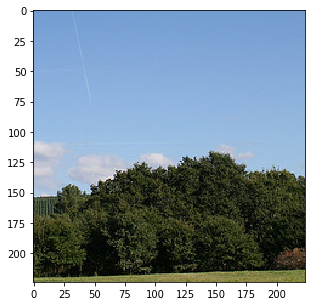

Probability 9.77% of [barn]
Probability 7.35% of [worm fence, snake fence, snake-rail fence, Virginia fence]
Probability 6.71% of [water tower]
Probability 6.63% of [rapeseed]
Probability 4.86% of [hay]


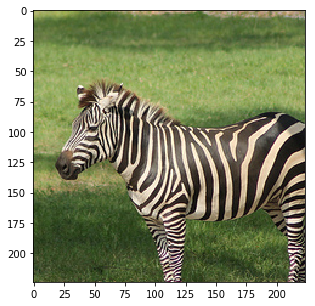

Probability 100.00% of [zebra]
Probability 0.00% of [gazelle]
Probability 0.00% of [ostrich, Struthio camelus]
Probability 0.00% of [impala, Aepyceros melampus]
Probability 0.00% of [hartebeest]


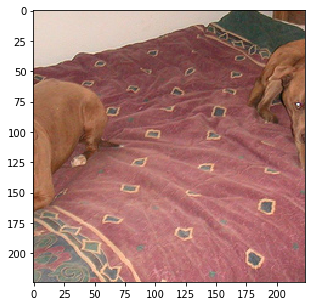

Probability 60.31% of [vizsla, Hungarian pointer]
Probability 20.54% of [redbone]
Probability 9.00% of [Chesapeake Bay retriever]
Probability 7.32% of [Rhodesian ridgeback]
Probability 0.68% of [Weimaraner]


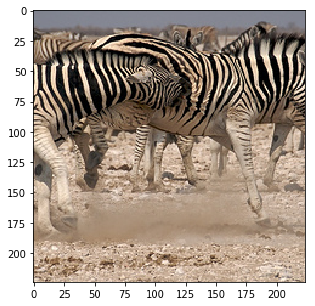

Probability 99.98% of [zebra]
Probability 0.01% of [gazelle]
Probability 0.00% of [impala, Aepyceros melampus]
Probability 0.00% of [hartebeest]
Probability 0.00% of [ostrich, Struthio camelus]


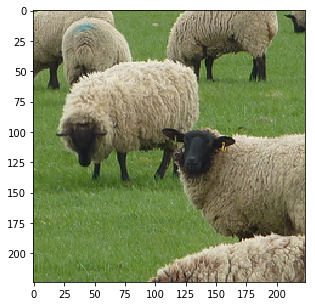

Probability 100.00% of [ram, tup]
Probability 0.00% of [bighorn, bighorn sheep, cimarron, Rocky Mountain bighorn, Rocky Mountain sheep, Ovis canadensis]
Probability 0.00% of [llama]
Probability 0.00% of [kuvasz]
Probability 0.00% of [komondor]


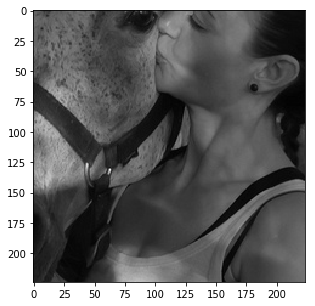

Probability 25.51% of [oxygen mask]
Probability 16.66% of [gasmask, respirator, gas helmet]
Probability 7.88% of [muzzle]
Probability 2.55% of [Weimaraner]
Probability 2.38% of [mask]


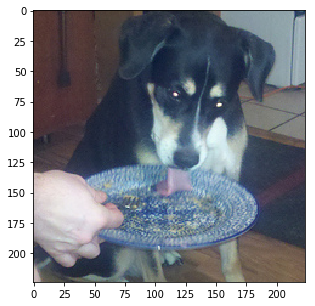

Probability 19.33% of [kelpie]
Probability 15.84% of [Appenzeller]
Probability 10.26% of [Greater Swiss Mountain dog]
Probability 9.51% of [EntleBucher]
Probability 6.43% of [Border collie]


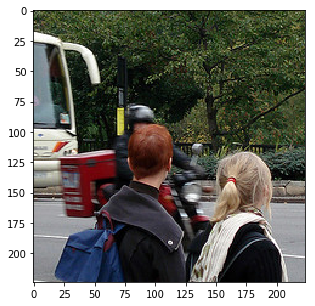

Probability 9.62% of [jinrikisha, ricksha, rickshaw]
Probability 8.20% of [minibus]
Probability 6.38% of [academic gown, academic robe, judge's robe]
Probability 5.05% of [minivan]
Probability 4.11% of [garbage truck, dustcart]


In [17]:
disp(images_test,id2label=inet.id2label,probs=probs,scale=True)

### Predict coco animals images using VGG16 - Preprocessing in TF

In [18]:
tf.reset_default_graph()

In [19]:
def tf_preprocess(filelist):
    images=[]
    for filename in filelist:
        image_string = tf.read_file(filename)
        image_decoded = tf.image.decode_jpeg(image_string, channels=3)
        image_float = tf.cast(image_decoded, tf.float32)
        resize_fn = tf.image.resize_image_with_crop_or_pad
        image_resized = resize_fn(image_float, image_height, image_width)
        means = tf.reshape(tf.constant([123.68, 116.78, 103.94]), [1, 1, 3])
        image = image_resized - means
        images.append(image)
        
    images = tf.stack(images)
    return images

In [20]:
images=tf_preprocess([x for x in x_test])
print(images)

Tensor("stack_24:0", shape=(8, 224, 224, 3), dtype=float32)


In [21]:
with slim.arg_scope(vgg.vgg_arg_scope()):
    logits,_ = vgg.vgg_16(images,
                          num_classes=inet.n_classes,
                          is_training=False
                         )
probabilities = tf.nn.softmax(logits)

init = slim.assign_from_checkpoint_fn(
        os.path.join(model_home, '{}.ckpt'.format(model_name)),
        slim.get_variables_to_restore())

In [22]:
with tf.Session() as tfs:
    init(tfs)
    np_images,probs = tfs.run([images,probabilities])

INFO:tensorflow:Restoring parameters from /home/armando/models/vgg_16/vgg_16.ckpt


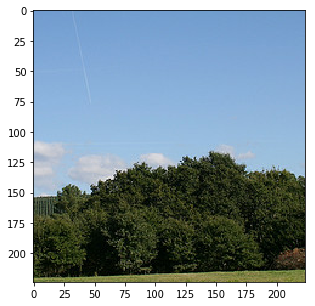

Probability 10.68% of [barn]
Probability 7.73% of [worm fence, snake fence, snake-rail fence, Virginia fence]
Probability 6.94% of [rapeseed]
Probability 6.56% of [water tower]
Probability 5.03% of [hay]


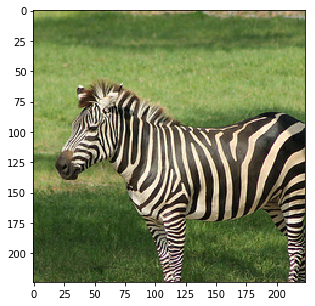

Probability 100.00% of [zebra]
Probability 0.00% of [gazelle]
Probability 0.00% of [ostrich, Struthio camelus]
Probability 0.00% of [impala, Aepyceros melampus]
Probability 0.00% of [hartebeest]


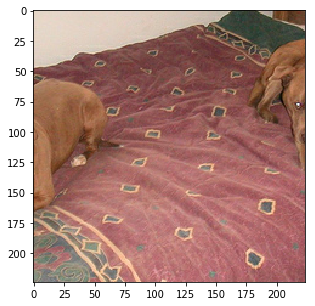

Probability 62.53% of [vizsla, Hungarian pointer]
Probability 18.38% of [redbone]
Probability 8.99% of [Chesapeake Bay retriever]
Probability 7.35% of [Rhodesian ridgeback]
Probability 0.67% of [Weimaraner]


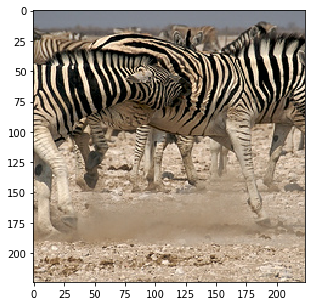

Probability 99.98% of [zebra]
Probability 0.01% of [gazelle]
Probability 0.00% of [impala, Aepyceros melampus]
Probability 0.00% of [hartebeest]
Probability 0.00% of [ostrich, Struthio camelus]


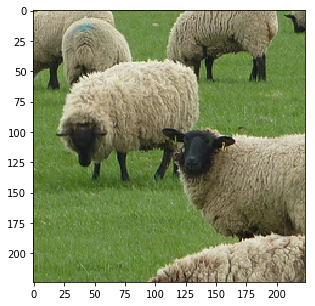

Probability 100.00% of [ram, tup]
Probability 0.00% of [bighorn, bighorn sheep, cimarron, Rocky Mountain bighorn, Rocky Mountain sheep, Ovis canadensis]
Probability 0.00% of [llama]
Probability 0.00% of [kuvasz]
Probability 0.00% of [komondor]


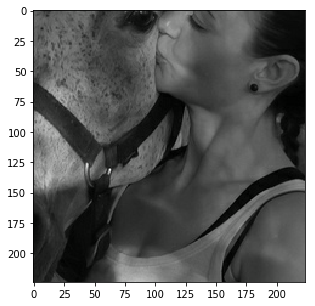

Probability 23.94% of [oxygen mask]
Probability 14.33% of [gasmask, respirator, gas helmet]
Probability 7.46% of [muzzle]
Probability 4.08% of [Weimaraner]
Probability 2.81% of [cowboy hat, ten-gallon hat]


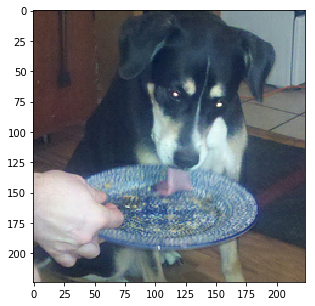

Probability 21.35% of [kelpie]
Probability 15.19% of [Appenzeller]
Probability 10.27% of [EntleBucher]
Probability 9.49% of [Greater Swiss Mountain dog]
Probability 5.98% of [Border collie]


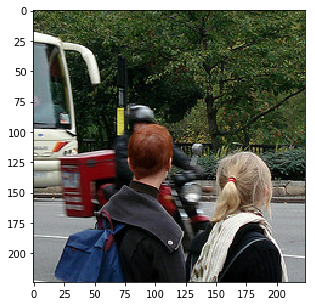

Probability 9.12% of [jinrikisha, ricksha, rickshaw]
Probability 8.37% of [minibus]
Probability 6.30% of [academic gown, academic robe, judge's robe]
Probability 5.04% of [minivan]
Probability 4.19% of [garbage truck, dustcart]


In [23]:
disp(np_images,id2label=inet.id2label,probs=probs,scale=True)

### Predict coco animals images using retrained VGG16

In [24]:
tf.reset_default_graph()

In [25]:
is_training = tf.placeholder(tf.bool,name='is_training')
x_p = tf.placeholder(shape=(None,
                            image_height, 
                            image_width,
                            3
                           ),
                     dtype=tf.float32,
                     name='x_p')
y_p = tf.placeholder(shape=(None,1),dtype=tf.int32,name='y_p')

In [26]:
with slim.arg_scope(vgg.vgg_arg_scope()):
    logits, _ = vgg.vgg_16(x_p,
                           num_classes=coco.n_classes,
                           is_training=is_training
                          )
    
probabilities = tf.nn.softmax(logits)

# restore except last last layer fc8
restore_fn = tf.contrib.framework.get_variables_to_restore
fc7_variables = restore_fn(exclude=['vgg_16/fc8'])

fc7_init = tf.contrib.framework.assign_from_checkpoint_fn(
    os.path.join(model_home, '{}.ckpt'.format(model_name)),
    fc7_variables)

# fc8 layer
fc8_variables = tf.contrib.framework.get_variables('vgg_16/fc8')
fc8_init = tf.variables_initializer(fc8_variables)

In [27]:
tf.losses.sparse_softmax_cross_entropy(labels=y_p, logits=logits)
loss = tf.losses.get_total_loss()

In [28]:
learning_rate = 0.001
fc8_optimizer = tf.train.GradientDescentOptimizer(learning_rate = learning_rate)
fc8_train_op = fc8_optimizer.minimize(loss, var_list=fc8_variables)

full_optimizer = tf.train.GradientDescentOptimizer(learning_rate=learning_rate)
full_train_op = full_optimizer.minimize(loss)    

In [29]:
y_pred = tf.to_int32(tf.argmax(logits, 1))
n_correct_pred = tf.equal(y_pred, y_p)
accuracy = tf.reduce_mean(tf.cast(n_correct_pred, tf.float32))

In [30]:
fc8_epochs = 10
full_epochs = 10
coco.y_onehot = False
coco.batch_size = 32
coco.batch_shuffle = True

total_images = len(x_train_files)
n_batches = total_images // coco.batch_size

with tf.Session() as tfs:
        fc7_init(tfs)  
        tfs.run(fc8_init)  
        
        for epoch in range(fc8_epochs):
            print('Starting fc8 epoch ',epoch)
            coco.reset_index()
            epoch_accuracy=0
            for batch in range(n_batches):
                try
                    x_batch, y_batch = coco.next_batch()
                    images=np.array([coco.preprocess_for_vgg(x) for x in x_batch])

                    feed_dict = {x_p: images,y_p: y_batch,is_training: True}
                    tfs.run(fc8_train_op, feed_dict = feed_dict)

                    feed_dict={x_p: images, y_p: y_batch,is_training: False}
                    batch_accuracy = tfs.run(accuracy,feed_dict=feed_dict)
                    epoch_accuracy += batch_accuracy
                except Exception as ex:
                    print('error in fc8 epoch {} batch {}'.format(epoch,batch))
                    raise(ex)
            epoch_accuracy /= n_batches
            print('Train accuracy in epoch {}:{}'.format(epoch,epoch_accuracy))
        
        for epoch in range(full_epochs):
            print('Starting full epoch ',epoch)
            coco.reset_index()
            epoch_accuracy=0
            for batch in range(n_batches):
                try:
                    x_batch, y_batch = coco.next_batch()
                    images=np.array([coco.preprocess_for_vgg(x) for x in x_batch])
                    
                    feed_dict = {x_p: images,y_p: y_batch,is_training: True}
                    tfs.run(full_train_op, feed_dict = feed_dict )

                    feed_dict={x_p: images, y_p: y_batch,is_training: False}
                    batch_accuracy = tfs.run(accuracy,feed_dict=feed_dict)
                    epoch_accuracy += batch_accuracy
                except:
                    print('error in full epoch {} batch {}'.format(epoch,batch))
                    raise(ex)
            epoch_accuracy /= n_batches
            print('Train accuracy in epoch {}:{}'.format(epoch,epoch_accuracy))
            
        # now run the predictions
        feed_dict={x_p:images_test,is_training: False}
        probs = tfs.run([probabilities],feed_dict=feed_dict)
        probs=probs[0]

INFO:tensorflow:Restoring parameters from /home/armando/models/vgg_16/vgg_16.ckpt
Starting fc8 epoch  0
Train accuracy in epoch 0:0.1312109375
Starting fc8 epoch  1
Train accuracy in epoch 1:0.143671875
Starting fc8 epoch  2
Train accuracy in epoch 2:0.1450390625
Starting fc8 epoch  3
Train accuracy in epoch 3:0.149296875
Starting fc8 epoch  4
Train accuracy in epoch 4:0.1437890625
Starting fc8 epoch  5
Train accuracy in epoch 5:0.146015625
Starting fc8 epoch  6
Train accuracy in epoch 6:0.144609375
Starting fc8 epoch  7
Train accuracy in epoch 7:0.1539453125
Starting fc8 epoch  8
Train accuracy in epoch 8:0.1437890625
Starting fc8 epoch  9
Train accuracy in epoch 9:0.1438671875
Starting full epoch  0
Train accuracy in epoch 0:0.1503515625
Starting full epoch  1
Train accuracy in epoch 1:0.1541015625
Starting full epoch  2
Train accuracy in epoch 2:0.1484765625
Starting full epoch  3
Train accuracy in epoch 3:0.1476171875
Starting full epoch  4
Train accuracy in epoch 4:0.156640625
Sta

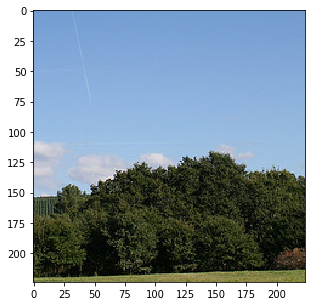

Probability 86.44% of [horse]
Probability 8.76% of [sheep]
Probability 2.81% of [dog]
Probability 0.82% of [zebra]
Probability 0.61% of [giraffe]


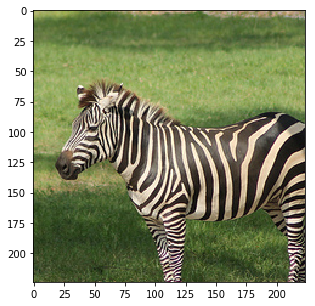

Probability 100.00% of [zebra]
Probability 0.00% of [giraffe]
Probability 0.00% of [horse]
Probability 0.00% of [cat]
Probability 0.00% of [sheep]


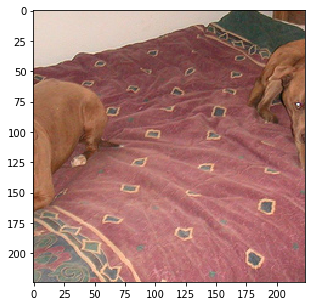

Probability 99.94% of [dog]
Probability 0.04% of [giraffe]
Probability 0.01% of [horse]
Probability 0.00% of [bear]
Probability 0.00% of [cat]


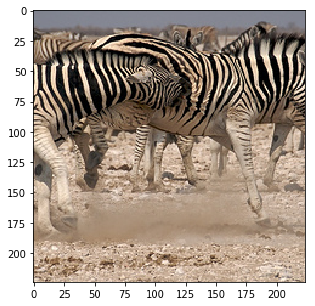

Probability 100.00% of [zebra]
Probability 0.00% of [horse]
Probability 0.00% of [giraffe]
Probability 0.00% of [bird]
Probability 0.00% of [sheep]


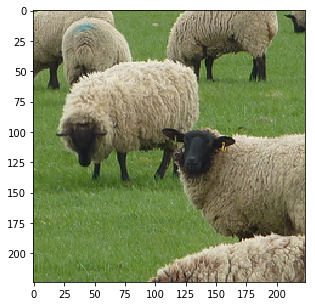

Probability 100.00% of [sheep]
Probability 0.00% of [horse]
Probability 0.00% of [bear]
Probability 0.00% of [dog]
Probability 0.00% of [zebra]


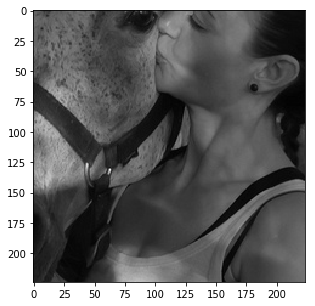

Probability 99.88% of [horse]
Probability 0.08% of [giraffe]
Probability 0.02% of [sheep]
Probability 0.01% of [dog]
Probability 0.01% of [bear]


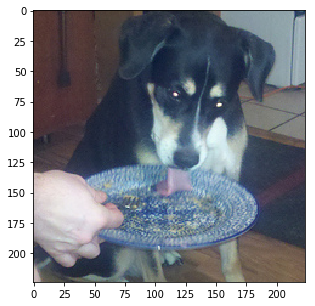

Probability 99.99% of [dog]
Probability 0.00% of [cat]
Probability 0.00% of [horse]
Probability 0.00% of [bear]
Probability 0.00% of [zebra]


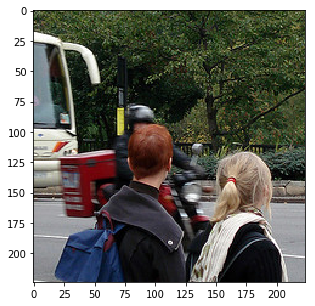

Probability 99.83% of [horse]
Probability 0.09% of [dog]
Probability 0.04% of [bird]
Probability 0.02% of [sheep]
Probability 0.01% of [bear]


In [31]:
disp(images_test,id2label=coco.id2label,probs=probs,scale=True)